<a href="https://colab.research.google.com/github/DaverArenas/procesamientoSe-alesInteligenciaArtificial/blob/main/Clase2E2_15_09_2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Procesamiento de señal de audio

Vamos a utilizar los filtros estudiados para realizar un proceso de eliminación de ruido en una señal de audio

## Cargar señal de audio
Para la carga de la señal de audio, vamos a utilizar la librería especializada en señales de audio `Librosa`, que nos permite manejar el archivo de audio como un array 



In [3]:
pip install librosa

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import IPython
from scipy.io import wavfile
import scipy.signal
from scipy.stats import norm
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
original, sr = librosa.load("/content/drive/MyDrive/Especializacion BigData EIA/Procesamiento_Señales/Clase_2/The_Police.wav")
noise, sr2 = librosa.load("/content/drive/MyDrive/Especializacion BigData EIA/Procesamiento_Señales/Clase_2/Ruido.wav")

In [5]:
print(original.shape)
print(noise.shape)
print(sr)
print(sr2)

(1359022,)
(1324821,)
22050
22050


## Escuchar audios

In [6]:
IPython.display.Audio(data=original, rate=sr)

In [7]:
IPython.display.Audio(data = noise, rate = sr)

## Mezclar audios

In [8]:
start = 520000
end = 650000
OrgNoise = original[start:end]+noise[start:end]
print(OrgNoise.shape)

(130000,)


In [9]:
IPython.display.Audio(data = OrgNoise, rate = sr)

## Visualizar los archivos de audio

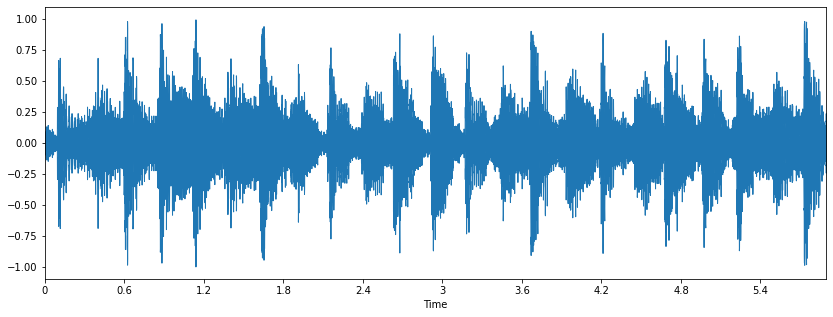

In [10]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(original[start:end], sr=sr)

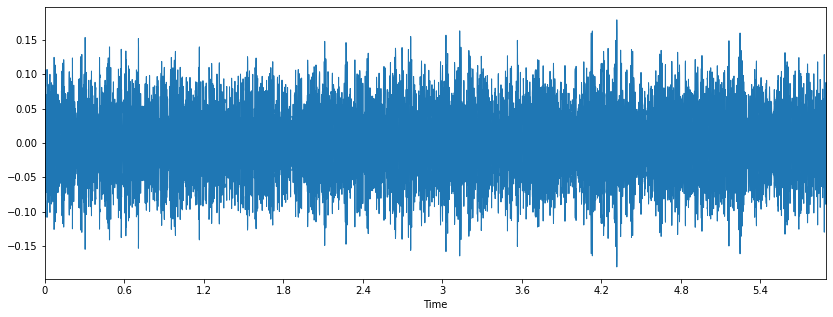

In [11]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(noise[start:end], sr=sr)

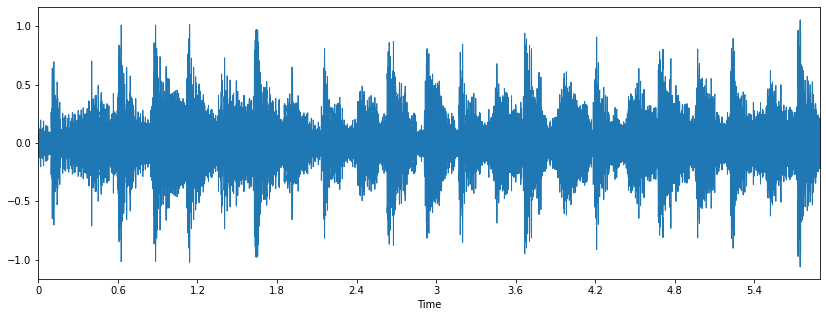

In [12]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(OrgNoise, sr=sr)

## Revisemos las características de la señal 

Text(0.5, 1.0, 'Histograma')

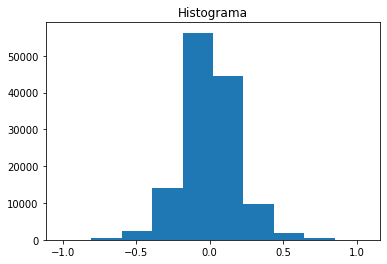

In [13]:
plt.hist(OrgNoise)
plt.title("Histograma")

In [14]:
meanSignal =  np.mean(OrgNoise)
stdSignal = np.std(OrgNoise)
dist = norm(loc = meanSignal, scale = stdSignal)

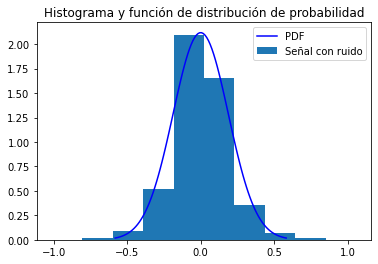

In [15]:
x = np.linspace(dist.ppf(0.001), dist.ppf(0.999), 100)
plt.hist(OrgNoise, density=True, label = "Señal con ruido")
plt.title("Histograma y función de distribución de probabilidad")
plt.plot(x, dist.pdf(x), "b-", label = "PDF")
plt.legend()

## Análisis de Frecuencias


In [16]:
from scipy import signal
f, Pxx_den = signal.welch(OrgNoise , sr)     

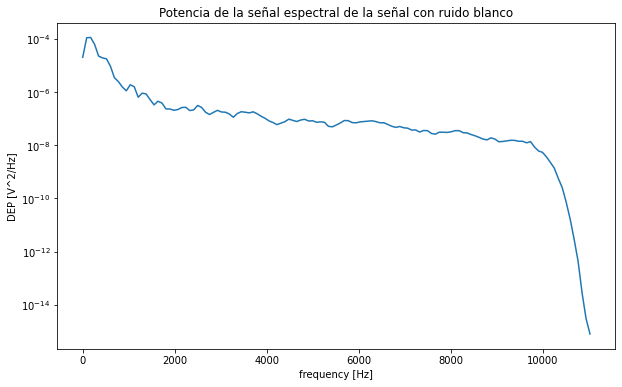

In [17]:
plt.figure(figsize=(10,6))
plt.semilogy(f, Pxx_den)
plt.title('Potencia de la señal espectral de la señal con ruido blanco')
plt.xlabel('frequency [Hz]')
plt.ylabel('DEP [V^2/Hz]')
plt.show()

## Transformada de Fourier
Esta función es la misma de la clase pasada, retorna los coeficientes de la transformada de Fourier y las frecuencias, además de mostrar las gráficas de la señal original y las frecuencias de la misma

In [18]:
from scipy.fftpack import fft, fftfreq
def plotFft(signal, t, name):
  dft = fft(signal) / len(t)
  freq = fftfreq(len(t), (t[1]-t[0]))
  fig = plt.figure(figsize=(10,5))
  ax1 = fig.add_subplot(211)
  ax1.plot(t, signal)
  ax1.set_xlabel('Tiempo')
  ax1.set_ylabel(' señal')
  ax1.set_title(name)
    
  ax2 =  fig.add_subplot(212)
  ax2.vlines(freq, 0 , abs(dft))
  ax2.set_xlabel('frequency [Hz]')
  ax2.set_ylabel('(Abs) señal')
  ax2.set_title("Transformada de Fourier")
  plt.show()
  return dft, freq

Se debe generar el vector de tiempos para analizar la transformada de Fourier


In [19]:
t = np.arange(0,(len(OrgNoise)/sr),(1/sr))
print((t))

[0.00000000e+00 4.53514739e-05 9.07029478e-05 ... 5.89555556e+00
 5.89560091e+00 5.89564626e+00]


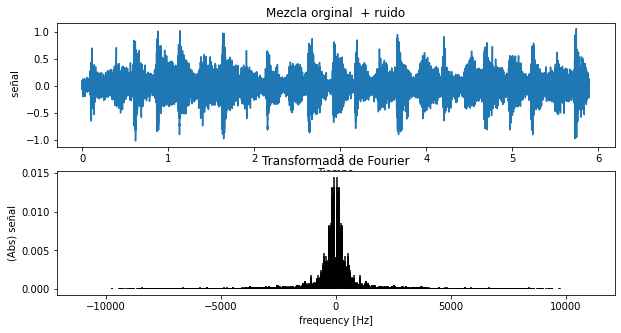

In [20]:
dft, freq = plotFft(OrgNoise, t, "Mezcla orginal  + ruido")

In [21]:
print("Valor de la frecuecia máxima" , freq[np.where(abs(dft) == max(abs(dft)))])

Valor de la frecuecia máxima [ 70.39038462 -70.39038462]


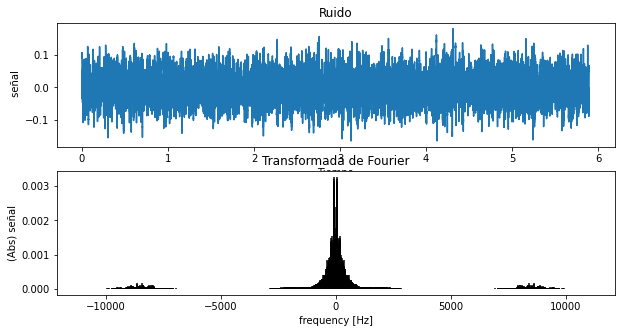

In [ ]:
dft, freq = plotFft(noise[start:end], t,  "Ruido")

In [ ]:
print("Valor de la frecuecia máxima" , freq[np.where(abs(dft) == max(abs(dft)))])

Valor de la frecuecia máxima [ 55.80346154 -55.80346154]


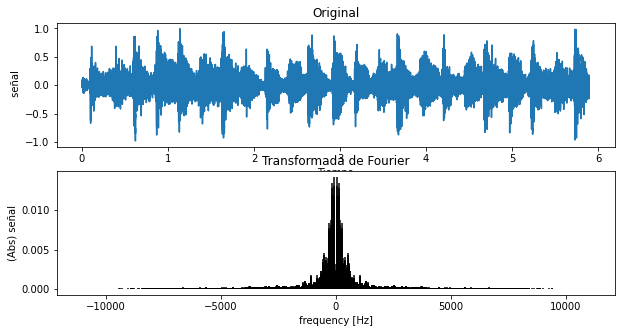

In [ ]:
dft, freq = plotFft(original[start:end], t, "Original")

In [ ]:
print("Valor de la frecuecia máxima" , freq[np.where(abs(dft) == max(abs(dft)))])

Valor de la frecuecia máxima [ 70.39038462 -70.39038462]


## Filtros FIR
De acuerdo con el análisis frecuencial vamos a probar diferentes filtros y observar su respuesta en frecuencia, además escucharemos como se transforma el audio de acuerdo con los filtros aplicados

### Filtro de media móvil

In [ ]:
def maFilter(x, N):                            # Recibe la señal, recibe el tiempo total y el tamaño de la ventana 
  xTemp = np.zeros([len(x) + (N-1)])
  xTemp[(N-1):] = x
  y = np.zeros(x.shape)
  
  for i in range(0, len(x)):
    y[i] = xTemp[i:i +N]. sum() / float(N)
  return y

In [ ]:
signalEv = OrgNoise

In [ ]:
window = 100                                                                      # Cantidad de muestras 
signalFilter = maFilter(signalEv, window)

### Filtro SG

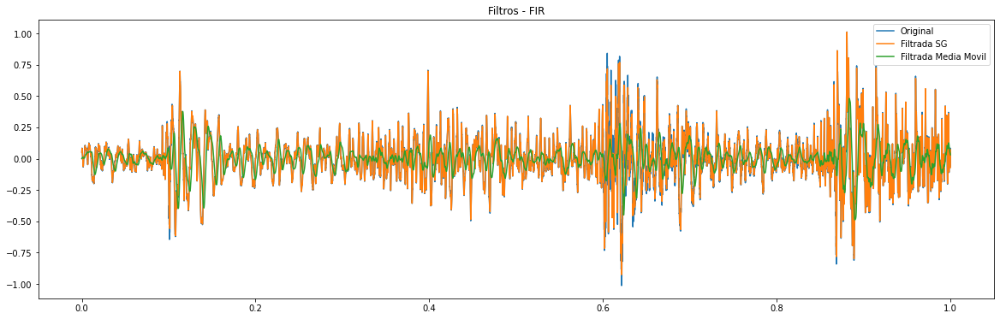

In [ ]:
lengthPlot = 22050

from scipy.signal import savgol_filter
window = 9                                                                      # Cantidad de muestras debe ser un valor impar
polOrder = 3                                                               
signalFilterSG = savgol_filter(signalEv, window, polOrder)                        # Parámetros: señal, tamaño de la ventana, orden del polinomio
plt.figure(figsize=(20,6))
plt.plot(t[0:lengthPlot],signalEv[0:lengthPlot], label = "Original")
plt.plot(t[0:lengthPlot],signalFilterSG[0:lengthPlot],  label = "Filtrada SG")
plt.plot(t[0:lengthPlot],signalFilter[0:lengthPlot],  label = "Filtrada Media Movil")

plt.title("Filtros - FIR")
plt.legend()

In [ ]:
IPython.display.Audio(data=OrgNoise, rate=sr)

In [ ]:
IPython.display.Audio(data=signalFilter, rate=sr)

In [ ]:
IPython.display.Audio(data=signalFilterSG, rate=sr)

## Filtros IIR

### Butterworth

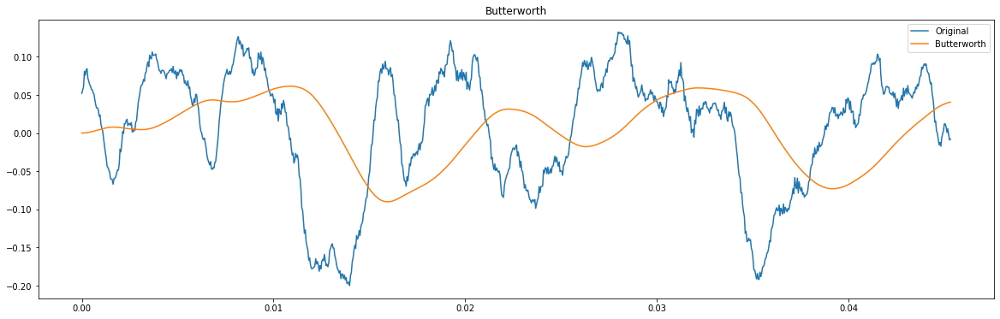

In [ ]:
lengthPlot = 1000
from scipy.signal import freqz, butter, lfilter
nyq = sr *0.5
cutf = 70                                                                      # Frecuencia de corte
low = cutf / nyq                                                                # Frcuencia crítica 

b, a = signal.butter(2, low, 'lowpass' )                                    

y_filtered = lfilter(b, a, signalEv)

plt.figure(figsize=(20,6))
plt.plot(t[0:lengthPlot],signalEv[0:lengthPlot], label = "Original")
plt.plot(t[0:lengthPlot],y_filtered[0:lengthPlot],  label = "Butterworth")

plt.title("Butterworth")
plt.legend()

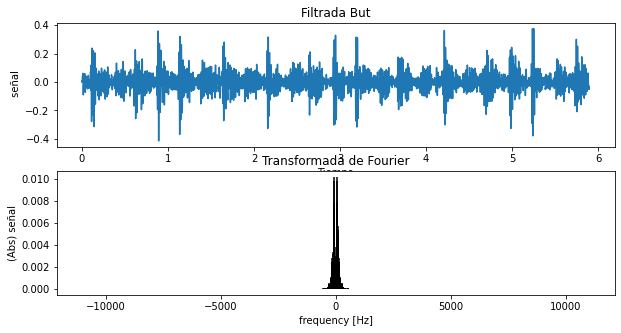

In [ ]:
dft, freq = plotFft(y_filtered, t, 'Filtrada But')

In [ ]:
print("Valor de la frecuecia máxima" , freq[np.where(abs(dft) == max(abs(dft)))])

Valor de la frecuecia máxima [ 70.39038462 -70.39038462]


In [ ]:
IPython.display.Audio(data=y_filtered, rate=sr)

In [ ]:
from scipy.signal import butter, lfilter
# Cambiar las frecuencias de corte para analizar la transformada de Fourier
lowcut = 70            
highcut = 5000

nyq = 0.5 * sr
low = lowcut / nyq
high = highcut / nyq
b, a = butter(5, [low, high], btype='bandpass')
y_filteredBand = lfilter(b, a, signalEv)

In [ ]:
IPython.display.Audio(data= y_filteredBand, rate=sr)

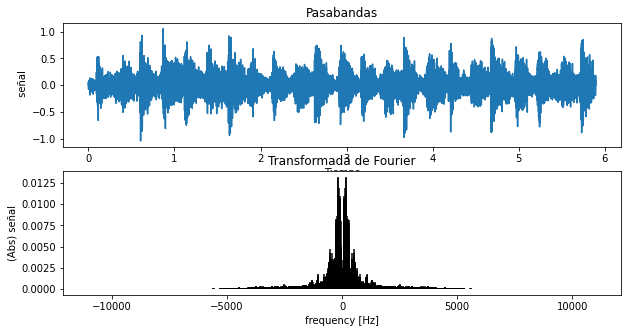

In [ ]:
dft, freq = plotFft(y_filteredBand, t, 'Pasabandas')

### Chebyshev
Probar la diferencia entre el tipo I y tipo II 

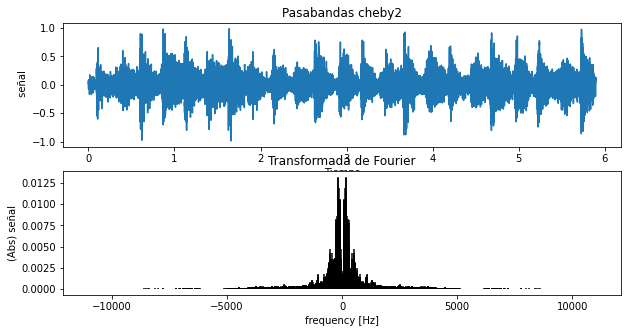

In [ ]:
b, a = signal.cheby2(3, 5, [low, high], btype='bandpass')
y_filteredCheb = lfilter(b, a, signalEv )
dft, freq = plotFft(y_filteredCheb, t, 'Pasabandas cheby2')

In [ ]:
IPython.display.Audio(data= y_filteredCheb, rate=sr)

## Respuesta de los filtros

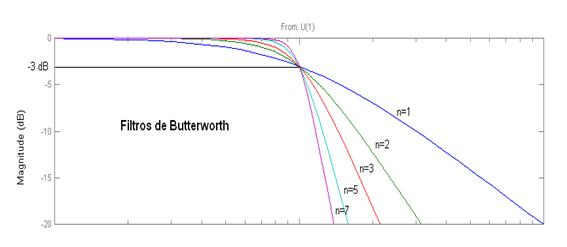

In [ ]:
from IPython.display import Image
Image(filename='/content/drive/MyDrive/Colab Notebooks/2022_II_signal_processing/Clase_2/Butter.jpg', width=600)

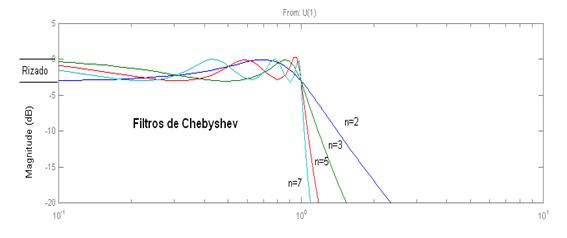

In [ ]:
Image(filename='/content/drive/MyDrive/Colab Notebooks/2022_II_signal_processing/Clase_2/Chebyshev.jpg', width=600)

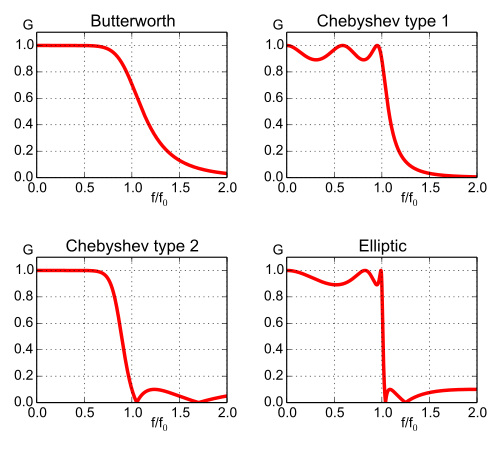

In [ ]:
Image(filename='/content/drive/MyDrive/Colab Notebooks/2022_II_signal_processing/Clase_2/Chebyshev2.jpg', width=600)

# Separación vocal

In [ ]:
y = original[start:end]
IPython.display.Audio(data= y, rate=sr)

Vamos a calcular el espectograma el cual es una representación visual de las variaciones de frecuencia en el eje vertical y de la intensidad de sonido mediante niveles de colores a lo largo del tiempo 

In [ ]:
S_full, phase = librosa.magphase(librosa.stft(y))

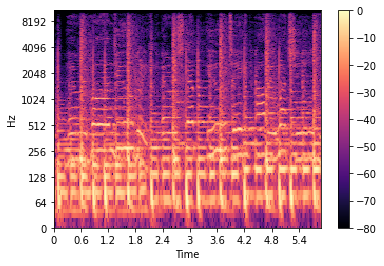

In [ ]:
fig, ax = plt.subplots()
img = librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr, ax=ax)
fig.colorbar(img, ax=ax)

Se realiza un filtrado de la matriz similar al de suavizado, visto anteriormente

In [ ]:
S_filter = librosa.decompose.nn_filter(S_full,
                                       aggregate=np.median,
                                       metric='cosine',
                                       width=int(librosa.time_to_frames(2, sr=sr)))

S_filter = np.minimum(S_full, S_filter)

Para realizar la separación de sonidos se utiliza la señal original como una máscara para filtrar con respecto a la señal filtrada, la cual corresponde a la siguiente operación 
>$M = \frac{X^{power}}{ (X^{power} + X_{ref}^{power})}$ 



In [ ]:
margin_i, margin_v = 2, 10
power = 2
#Mask_i = matriz para el filtrado de los instrumentos
mask_i = librosa.util.softmask(S_filter,
                               margin_i * (S_full - S_filter),
                               power=power)
#Mask_v = matriz para el filtrado de la voz
mask_v = librosa.util.softmask(S_full - S_filter,
                               margin_v * S_filter,
                               power=power)


S_foreground = mask_v * S_full
S_background = mask_i * S_full

Ahora graficamos los espectogramas correspondientes a la señal original, a la separación vocal y a la instrumental

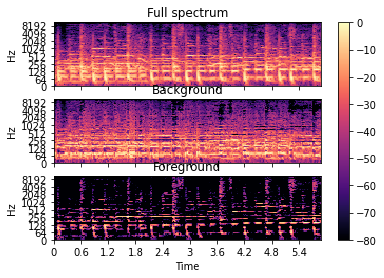

In [ ]:
fig, ax = plt.subplots(nrows=3, sharex=True, sharey=True)
img = librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr, ax=ax[0])
ax[0].set(title='Full spectrum')
ax[0].label_outer()

librosa.display.specshow(librosa.amplitude_to_db(S_background, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr, ax=ax[1])
ax[1].set(title='Background')
ax[1].label_outer()

librosa.display.specshow(librosa.amplitude_to_db(S_foreground, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr, ax=ax[2])
ax[2].set(title='Foreground')
fig.colorbar(img, ax=ax)

In [ ]:
y_foreground = librosa.istft(S_foreground * phase)

IPython.display.Audio(data= y_foreground, rate=sr)

In [ ]:
y_background = librosa.istft(S_background * phase)

IPython.display.Audio(data= y_background, rate=sr)

In [ ]:
y_fast = librosa.effects.time_stretch(original, 2.0)

In [ ]:
IPython.display.Audio(data= y_fast, rate=sr)

## Guardando audio

In [ ]:
import soundfile as sf

In [ ]:
sf.write('soloVoz.wav', y_foreground, sr, format='wav')